**TensorFlow 2 Object Detection API with Google Colab**

Author: Nisarg Kapkar

Link to [Medium Article](https://medium.com/@nisargkapkar/tensorflow-2-object-detection-api-with-google-colab-b2af171e81cc?source=friends_link&sk=0bb205df0e1c29a2e78c28671ddf4494)! 

NOT: Use this NoteBook in association with the mentioned Medium article, the article contains detailed information (which is not mentioned in this NoteBook) for Step 1, Step 2 and Step 13!

Link to [GitHub Repository](https://github.com/Nkap23/TensorFlow_with_Colab_tutorial)!

Step 1- Prerequisites(Gather/Label images,Create label_map...)

Refer the mentioned [Medium article](https://medium.com/@nisargkapkar/tensorflow-2-object-detection-api-with-google-colab-b2af171e81cc?source=friends_link&sk=0bb205df0e1c29a2e78c28671ddf4494) for more details!

Step 2- Set up the directory structure on Google Drive.

Refer the mentioned [Medium article](https://medium.com/@nisargkapkar/tensorflow-2-object-detection-api-with-google-colab-b2af171e81cc?source=friends_link&sk=0bb205df0e1c29a2e78c28671ddf4494) for more details!

Step 3- Select Hardware Accelerator.

On Colab, go to Runtime->Change Runtime Type and select Hardware accelerator as GPU.

NOTE:
If you have given different names to your files and folders, change the paths in cells below according to your files and folders!

In [ ]:
#Step 4- Mount Google Drive.

from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#Step 5- Download TensorFlow Model Garden.

#cd into the TensorFlow directory in your Google Drive
%cd '/content/gdrive/My Drive/TensorFlow'

#and clone the TensorFlow Model Garden repository
!git clone https://github.com/tensorflow/models.git

#using a older version of repo (21 Sept 2020)
%cd '/content/gdrive/MyDrive/TensorFlow/models'
!git checkout -f e04dafd04d69053d3733bb91d47d0d95bc2c8199

/content/gdrive/My Drive/TensorFlow
Cloning into 'models'...
remote: Enumerating objects: 68474, done.
remote: Total 68474 (delta 0), reused 0 (delta 0), pack-reused 68474
Receiving objects: 100% (68474/68474), 576.94 MiB | 15.42 MiB/s, done.
Resolving deltas: 100% (48246/48246), done.
Checking out files: 100% (2861/2861), done.
/content/gdrive/MyDrive/TensorFlow/models
Checking out files: 100% (2014/2014), done.
Note: checking out 'e04dafd04d69053d3733bb91d47d0d95bc2c8199'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at e04dafd04 Add copybara presumbit metadata, and move files to root dir.


In [ ]:
#Step 6- Install some required libraries and tools.

!apt-get install protobuf-compiler python-lxml python-pil
!pip install Cython pandas tf-slim lvis

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following additional packages will be installed:
  python-bs4 python-chardet python-html5lib python-olefile
  python-pkg-resources python-six python-webencodings
Suggested packages:
  python-genshi python-lxml-dbg python-lxml-doc python-pil-doc python-pil-dbg
  python-setuptools
The following NEW packages will be installed:
  python-bs4 python-chardet python-html5lib python-lxml python-olefile
  python-pil python-pkg-resources python-six python-webencodings
0 upgraded, 9 newly installed, 0 to remove and 37 not upgraded.
Need to get 1,614 kB of archives.
After this operation, 8,908 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-bs4 all 4.6.0-1 [67.9 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-pkg-resources all 39.0.1-2 [128 kB]
Get:3 http:/

In [ ]:
#Step 7- Compile the Protobuf libraries.

#cd into 'TensorFlow/models/research'
%cd '/content/gdrive/My Drive/TensorFlow/models/research/'
!protoc object_detection/protos/*.proto --python_out=.

/content/gdrive/My Drive/TensorFlow/models/research


In [ ]:
#Step 8- Set the environment.

import os
import sys
os.environ['PYTHONPATH']+=":/content/gdrive/My Drive/TensorFlow/models"
sys.path.append("/content/gdrive/My Drive/TensorFlow/models/research")

In [ ]:
#Step 9- Build and Install setup.py.

!python setup.py build
!python setup.py install

running build
running build_py
creating build
creating build/lib
creating build/lib/object_detection
copying object_detection/__init__.py -> build/lib/object_detection
copying object_detection/eval_util.py -> build/lib/object_detection
copying object_detection/eval_util_test.py -> build/lib/object_detection
copying object_detection/export_inference_graph.py -> build/lib/object_detection
copying object_detection/export_tflite_graph_lib_tf2.py -> build/lib/object_detection
copying object_detection/export_tflite_graph_lib_tf2_test.py -> build/lib/object_detection
copying object_detection/export_tflite_graph_tf2.py -> build/lib/object_detection
copying object_detection/export_tflite_ssd_graph.py -> build/lib/object_detection
copying object_detection/export_tflite_ssd_graph_lib.py -> build/lib/object_detection
copying object_detection/export_tflite_ssd_graph_lib_tf1_test.py -> build/lib/object_detection
copying object_detection/exporter.py -> build/lib/object_detection
copying object_detect

In [ ]:
#Step 10- Test the installation.

#cd into 'TensorFlow/models/research/object_detection/builders/'
%cd '/content/gdrive/My Drive/TensorFlow/models/research/object_detection/builders/'
!python model_builder_tf2_test.py
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
print('Done')

/content/gdrive/MyDrive/TensorFlow/models/research/object_detection/builders
Running tests under Python 3.7.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2022-01-21 07:12:00.238536: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model): 5.41s
I0121 07:12:02.922053 140283101902720 test_util.py:2309] time(__main__.ModelBuilderTF2Test.test_create_center_net_model): 5.41s
[       OK ] ModelBuilderTF2Test.test_create_center_net_model
[ RUN      ] ModelBuilderTF2Test.test_create_experimental_model
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_experimental_model): 0.0s
I0121 07:12:02.923153 140283101902720 test_util.py:2309] time(__main__.ModelBuilderTF2Test.test_create_experimental_model): 0.0s
[       OK ] ModelBuilderTF2Test.

NOTE:

You should have the images in test and train folder (with their corresponding XML files) and label_map.pbtxt file ready in respective directories.

You should also have the generate_tfrecord.py in your preprocessing directory.

If you don't have these files ready, go back to Step 1 and finish downloading required files.

In [ ]:
#Step 11- Generate TFrecords.

#cd into preprocessing directory
%cd '/content/gdrive/My Drive/TensorFlow/scripts/preprocessing'

#run the cell to generate test.record and train.record
!python generate_tfrecord.py -x '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/train' -l '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt' -o '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/annotations/train.record'
!python generate_tfrecord.py -x '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test' -l '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt' -o '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/annotations/test.record'

# !python generate_tfrecord.py -x '[path_to_train_folder]' -l '[path_to_annotations_folder]/label_map.pbtxt' -o '[path_to_annotations_folder]/train.record'
# !python generate_tfrecord.py -x '[path_to_test_folder]' -l '[path_to_annotations_folder]/label_map.pbtxt' -o '[path_to_annotations_folder]/test.record'


/content/gdrive/My Drive/TensorFlow/scripts/preprocessing
Traceback (most recent call last):
  File "generate_tfrecord.py", line 172, in <module>
    tf.app.run()
  File "/usr/local/lib/python3.7/dist-packages/tensorflow/python/platform/app.py", line 40, in run
    _run(main=main, argv=argv, flags_parser=_parse_flags_tolerate_undef)
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 303, in run
    _run_main(main, args)
  File "/usr/local/lib/python3.7/dist-packages/absl/app.py", line 251, in _run_main
    sys.exit(main(argv))
  File "generate_tfrecord.py", line 162, in main
    tf_example = create_tf_example(group, path)
  File "generate_tfrecord.py", line 136, in create_tf_example
    classes.append(class_text_to_int(row['class']))
  File "generate_tfrecord.py", line 105, in class_text_to_int
    return label_map_dict[row_label]
KeyError: 'dog'
Traceback (most recent call last):
  File "generate_tfrecord.py", line 172, in <module>
    tf.app.run()
  File "/usr/local/li

NOTE:

If you haven't downloaded any pre-trained model yet, go back to Step 1 and finish downloading any pre-trained model of your choice.

We are almost ready to start our model training, just a few more steps before we start our model training!

Step 12- Copying some files


*   Copy the "model_main_tf2.py" file from   "TensorFlow\models\research\object_detection" and paste it into training_demo. We will need this file for training the model.

*   Copy the "exporter_main_v2.py" file from "TensorFlow\models\research\object_detection" and paste it into training_demo.
We will need this file to export the trained model






Step 13- Configure the pipeline file.

Refer the mentioned [Medium article](https://medium.com/@nisargkapkar/tensorflow-2-object-detection-api-with-google-colab-b2af171e81cc?source=friends_link&sk=0bb205df0e1c29a2e78c28671ddf4494) for more details!

In [ ]:
#Step 14- Start Tensorboard.

#cd into training_demo
%cd '/content/gdrive/My Drive/TensorFlow/workspace/training_demo'

#start the Tensorboard
%load_ext tensorboard
%tensorboard --logdir=models/my_ssd_resnet50_v1_fpn

# %load_ext tensorboard
# %tensorboard --logdir=models/[name_of_pre-trained-model_you_downloaded]

/content/gdrive/My Drive/TensorFlow/workspace/training_demo
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1315), started 0:09:32 ago. (Use '!kill 1315' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
#optional
#code to check how much session time is remaining 

import time,psutil
uptime=time.time()-psutil.boot_time()
remaintime=(12*60*60)-uptime
print(remaintime/(60*60))

10.960111610094707


In [ ]:
#Step 15- Train the model.

#run the cell to start model training 
!python model_main_tf2.py --model_dir=models/my_ssd_resnet50_v1_fpn --pipeline_config_path=models/my_ssd_resnet50_v1_fpn/pipeline.config

# !python model_main_tf2.py --model_dir=models/[name_of_pre-trained-model_you_downloaded] --pipeline_config_path=models/[name_of_pre-trained-model_you_downloaded]/pipeline.config

2022-01-21 07:58:16.158082: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0121 07:58:16.161434 139773867083648 mirrored_strategy.py:376] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: None
I0121 07:58:16.469669 139773867083648 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0121 07:58:16.469868 139773867083648 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0121 07:58:16.496132 139773867083648 deprecation.py:347] From /usr/local/lib/python3.7/dist-packages/object_detection-0.1-py3.7.egg/object_detection/model_lib_v2.

Congratulations! You have finished model training!

In [ ]:
#Step 16- Export the Trained Model.

#run the cell to start model training 
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path ./models/my_ssd_resnet50_v1_fpn/pipeline.config --trained_checkpoint_dir ./models/my_ssd_resnet50_v1_fpn/ --output_directory ./exported-models/my_model

# !python exporter_main_v2.py --input_type image_tensor --pipeline_config_path ./models/[name_of_pre-trained-model you downloaded]/pipeline.config --trained_checkpoint_dir ./models/[name_of_pre-trained-model_you_downloaded]/ --output_directory ./exported-models/my_model

2022-01-21 08:26:15.086209: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:39] Overriding allow_growth setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0121 08:26:32.093763 139890437457792 save_impl.py:72] Skipping full serialization of Keras layer <object_detection.meta_architectures.ssd_meta_arch.SSDMetaArch object at 0x7f3a200c69d0>, because it is not built.
2022-01-21 08:26:42.088720: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
W0121 08:26:59.353623 139890437457792 save.py:268] Found untraced functions such as WeightSharedConvolutionalBoxPredictor_layer_call_fn, WeightSharedConvolutionalBoxPredictor_layer_call_and_return_conditional_losses, WeightSharedConvolutionalBoxHead_layer_call_fn, WeightSharedConvolutionalBoxHead_layer_call_and_return_conditional_losses, WeightSharedConvolutionalBoxPredictor_layer_call_f

We have finished training and exporting our model. It's time to test our model!

In [ ]:
#Step 17- Test the Model.

#Loading the saved_model
import tensorflow as tf
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL="/content/gdrive/My Drive/TensorFlow/workspace/training_demo/exported-models/my_model/saved_model"

print('Loading model...', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)

print('Done!')

Loading model...Done!


In [ ]:
#Step 18- Testing the Model.

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/content/gdrive/My Drive/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt",use_display_name=True)

#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

Acknowledgements:

Huge Thanks to [Lyudmil Vladimirov](http://pcwww.liv.ac.uk/~sglvladi/) for allowing me to use some of the content from their amazing [TensorFlow 2 Object Detection API](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/index.html) for Local Machines!

Link to their [GitHub Repository](https://github.com/sglvladi/TensorFlowObjectDetectionTutorial).

In [ ]:
#Step 19- Testing the Model.

#Loading the image
img=[]
for i in range(81,101):
  img.append('/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/'+str(i)+'.jpg')

print(img)

#list containing paths of all the images

['/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/81.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/82.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/83.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/84.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/85.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/86.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/87.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/88.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/89.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/90.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/91.jpg', '/content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/92.jpg', '/content/gdriv

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/81.jpg... Done


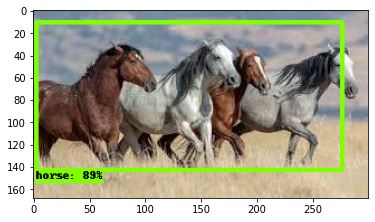

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/82.jpg... Done


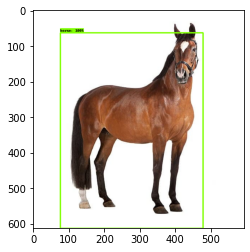

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/83.jpg... Done


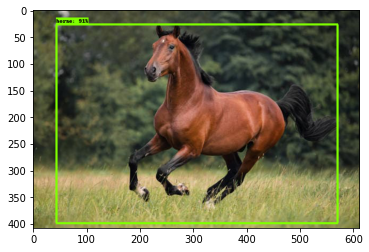

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/84.jpg... Done


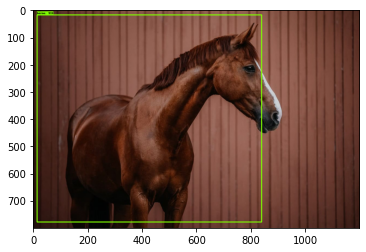

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/85.jpg... Done


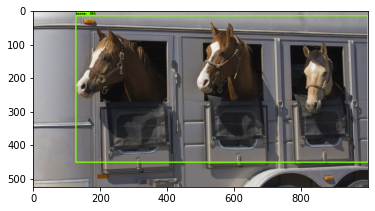

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/86.jpg... Done


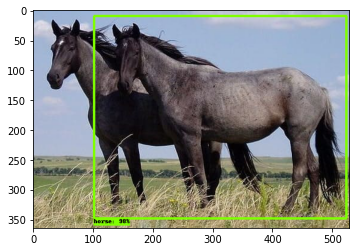

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/87.jpg... Done


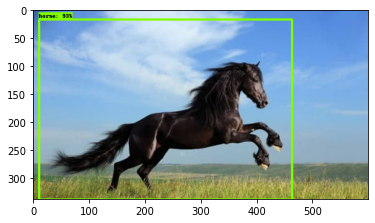

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/88.jpg... Done


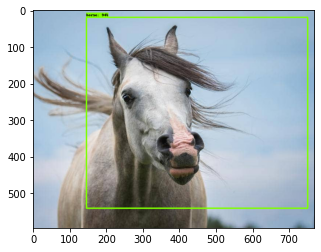

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/89.jpg... Done


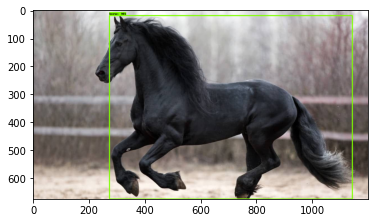

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/90.jpg... Done


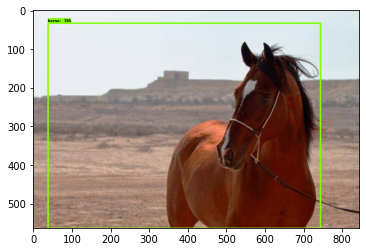

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/91.jpg... Done


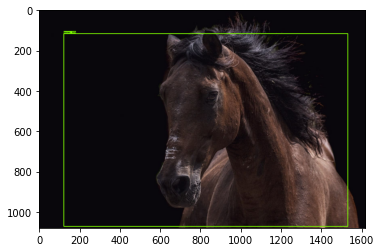

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/92.jpg... Done


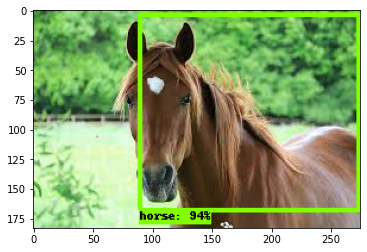

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/93.jpg... Done


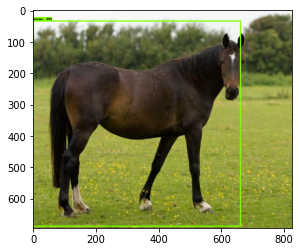

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/94.jpg... Done


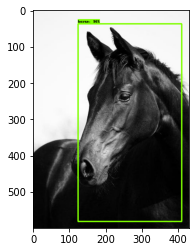

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/95.jpg... Done


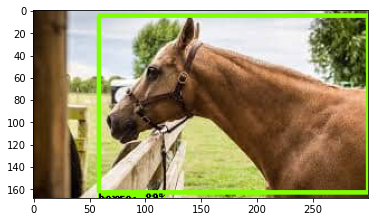

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/96.jpg... Done


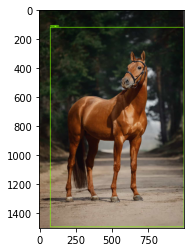

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/97.jpg... Done


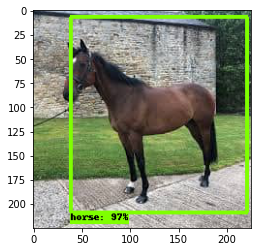

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/98.jpg... Done


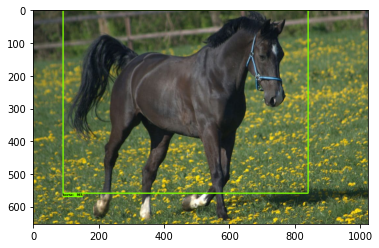

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/99.jpg... Done


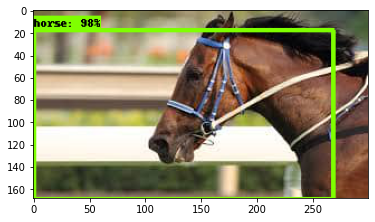

Running inference for /content/gdrive/My Drive/TensorFlow/workspace/training_demo/images/test/100.jpg... Done


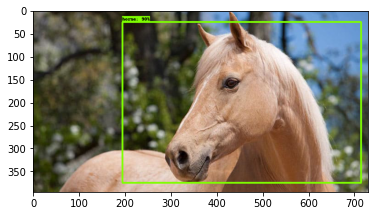

In [ ]:
#Step 20- Running the Inference.

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

for image_path in img:

    print('Running inference for {}... '.format(image_path), end='')
    image_np=load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()
    # Convert image to grayscale
    # image_np = np.tile(
    #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor=tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor=input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections=detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections=int(detections.pop('num_detections'))
    detections={key:value[0,:num_detections].numpy()
                   for key,value in detections.items()}
    detections['num_detections']=num_detections

    # detection_classes should be ints.
    detections['detection_classes']=detections['detection_classes'].astype(np.int64)

    image_np_with_detections=image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=1,     #max number of bounding boxes in the image
          min_score_thresh=.3,      #min prediction threshold
          agnostic_mode=False)
    %matplotlib inline
    plt.figure()
    plt.imshow(image_np_with_detections)
    print('Done')
    plt.show()